In [27]:
import os
import subprocess
import re
import pandas as pd
import numpy as np
import shutil

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.patheffects as path_effects
import plotly.express as px

from scipy.stats import spearmanr, pearsonr
from biopandas.pdb import PandasPdb

from tqdm import tqdm

In [2]:
# load data 
df  = pd.read_parquet("../bldb/clean/csv/bldb_dset.parquet")
sbl = df[df.bla_class.str.contains("class_a|class_c|class_d")]
mbl = df[df.bla_class.str.contains("class_b1|class_b2|class_b3")]

# load tsne
tsne_sbl = pd.read_parquet("../bldb/lowdim/tsne/csv/tsne_sbl_all_models.csv")
tsne_mbl = pd.read_parquet("../bldb/lowdim/tsne/csv/tsne_mbl_all_models.csv")

# merge 
sbl = sbl.merge(tsne_sbl, on="seq_id", how="inner")
mbl = mbl.merge(tsne_mbl, on="seq_id", how="inner")

# split
sbl_a = sbl[sbl.bla_class == "class_a"]
sbl_c = sbl[sbl.bla_class == "class_c"]
sbl_d = sbl[sbl.bla_class == "class_d"]
mbl_me = mbl[mbl.bla_class.str.contains("class_b3")]
mbl_mb = mbl[~mbl.bla_class.str.contains("class_b3")]

# print info
print(sbl.columns.to_list())

# a plot fx 
def do_iscatter(df, x, y, hue, hover_name, hover_data):

    # plot
    fig = px.scatter(df, x=x, y=y,
    height=700, width=800, color=hue,
    hover_name=hover_name, 
    color_discrete_sequence=px.colors.qualitative.Plotly,
    hover_data=hover_data
    )

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()

['#name', 'seq', 'length', 'filename', 'bla_class', 'protein_name', 'protein_family_filename', 'superfamily', 'protein_family', 'top_fam', 'seq_id', 'ambler_class', 'alternative_protein_name', 'subfamily', 'genpept_id', 'genbank_id', 'pubmed_id', 'seq_url', 'pdb_structures', 'mutants', 'phenotype', 'functional_info', 'source', 'bitscore', 'Domain', 'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species', 'phylo_group', 'phylo_group_genus', 'phylo_group_sp', 'bla_subclass', 'esm1b', 'esm2_650m', 'esm2_3b', 'carp', 't5xlu50', 'molecular_weight', 'aromaticity', 'instability', 'gravy', 'isoelectric_point', 'entropy', 'helix', 'turn', 'sheet', 'pass_the_filter', 'is_clust_rep_30', 'is_clust_rep_60', 'is_clust_rep_90', 'has_af2_model', 'model', 'mean_plddt', 'resid_plddt', 'entryId', 'gene', 'uniprotAccession', 'uniprotId', 'uniprotDescription', 'taxId', 'organismScientificName', 'uniprotStart', 'uniprotEnd', 'modelCreatedDate', 'latestVersion', 'allVersions', 'isReviewed', 'isReferenceProt

In [3]:
sbl_a  = sbl_a[(sbl_a.tsne1_esm1b_400.between(-80,30))]
sbl_d  = sbl_d[(sbl_d.tsne1_esm1b_400.between(-40,30))]
mbl_me = mbl_me[(mbl_me.tsne1_esm1b_400.between(0,40))]

In [13]:
# filter
sbl2 = sbl[sbl.pass_the_filter == "yes"]
mbl2 = mbl[mbl.pass_the_filter == "yes"]

sbl_a2  = sbl_a[sbl_a.pass_the_filter == "yes"]
sbl_c2  = sbl_c[sbl_c.pass_the_filter == "yes"]
sbl_d2  = sbl_d[sbl_d.pass_the_filter == "yes"]
mbl_me2 = mbl_me[mbl_me.pass_the_filter == "yes"]
mbl_mb2 = mbl_mb[mbl_mb.pass_the_filter == "yes"]

In [18]:
df.select_dtypes(["number"]).columns

Index(['length', 'pdb_structures', 'mutants', 'bitscore', 'molecular_weight',
       'aromaticity', 'instability', 'gravy', 'isoelectric_point', 'entropy',
       'helix', 'turn', 'sheet', 'mean_plddt', 'taxId', 'uniprotStart',
       'uniprotEnd', 'latestVersion', 'frec_turn', 'frec_helix', 'frec_beta'],
      dtype='object')

In [133]:
properties = [
    'frec_helix', 'frec_beta', 'frec_turn', 'length', 'molecular_weight', 
    'instability','isoelectric_point','gravy', 'aromaticity', 'entropy'
] 

af2_data = ['frec_helix', 'frec_beta', 'frec_turn']


def do_scatter_panel(df, dim1, dim2, title):

    # set figure composition
    plt.figure(figsize=(16, 9))  # 25,10

    # iterate over each panel
    for idx, prop in enumerate(properties):
        
        # Filter the DataFrame if prop is in af2_data
        if prop in af2_data:
            filtered_df = df[df['has_af2_model'] == 'yes']
        else:
            filtered_df = df

        # set palette
        palette = "Spectral_r"
        # create continuous colorbar normalized
        norm = plt.Normalize(filtered_df[prop].min(), filtered_df[prop].max())
        sm = plt.cm.ScalarMappable(cmap=palette, norm=norm)
        sm.set_array([])
        
        
        # plot
        ax = plt.subplot(3, 4, idx + 1)
        sns.scatterplot(
            data=filtered_df.sort_values(prop, ascending=True), x=dim1, y=dim2, alpha=1, s=5,
            style="bla_subclass", hue=prop, palette=palette, edgecolor="none", ax=ax)
        ax.set_title(f"{prop}")

        # axes
        ax.grid(alpha=0.3, linestyle="--")
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        ax.set_ylabel(f"")
        ax.set_xlabel(f"")
        ax.tick_params(axis='both', colors='white')
        ax.set_axisbelow(True)
        ax.set_facecolor('black')
    
        # remove default legend and add colorbar
        ax.get_legend().remove()
        cbar = ax.figure.colorbar(sm, ax=ax)
        cbar.set_label("")  # set label for colorbar
        plt.tight_layout()

    plt.suptitle(title)
    plt.tight_layout()

In [116]:
mbl2.has_af2_model.value_counts()

has_af2_model
yes    1706
no     1670
Name: count, dtype: int64

In [117]:
sbl2.has_af2_model.value_counts()

has_af2_model
no     14883
yes    10385
Name: count, dtype: int64

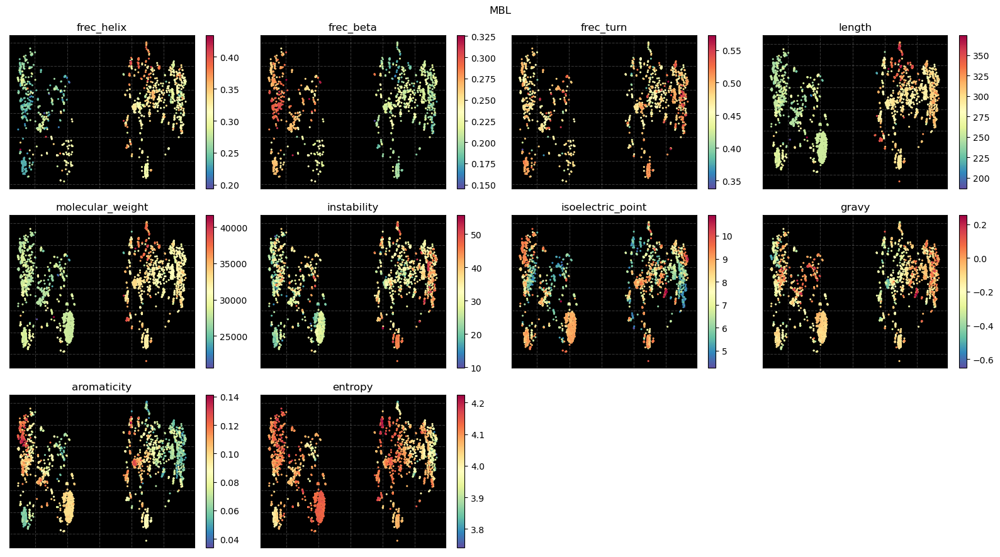

In [134]:
do_scatter_panel(mbl2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"MBL")

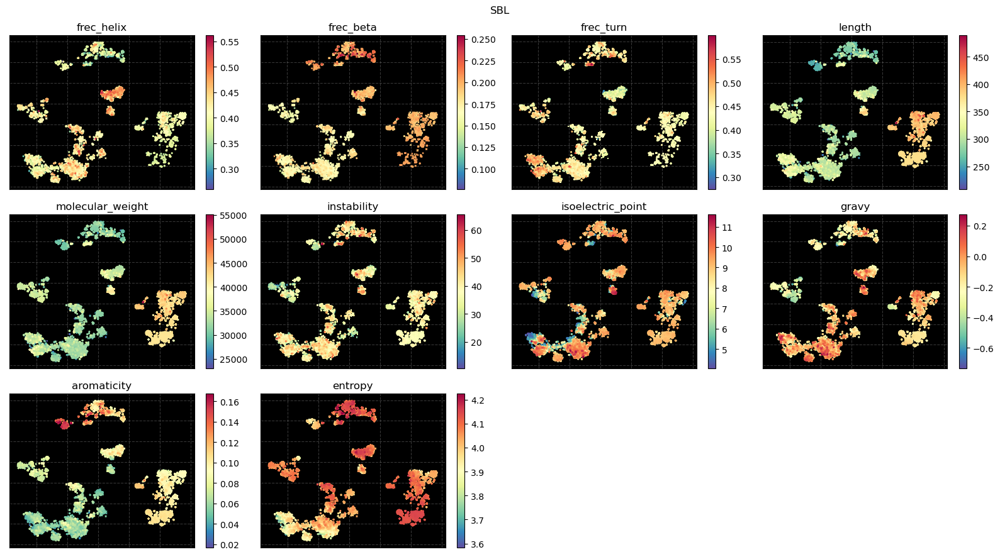

In [135]:
do_scatter_panel(sbl2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"SBL")

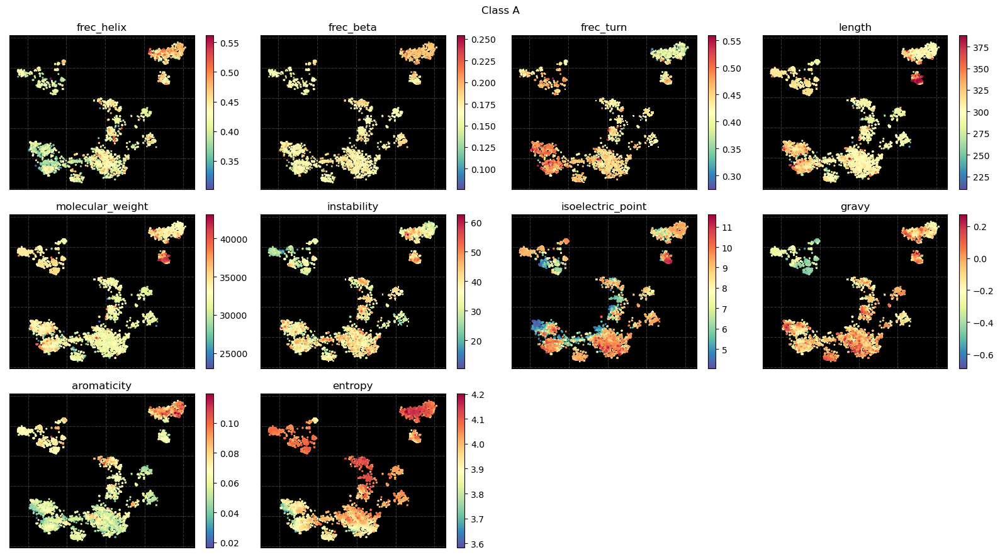

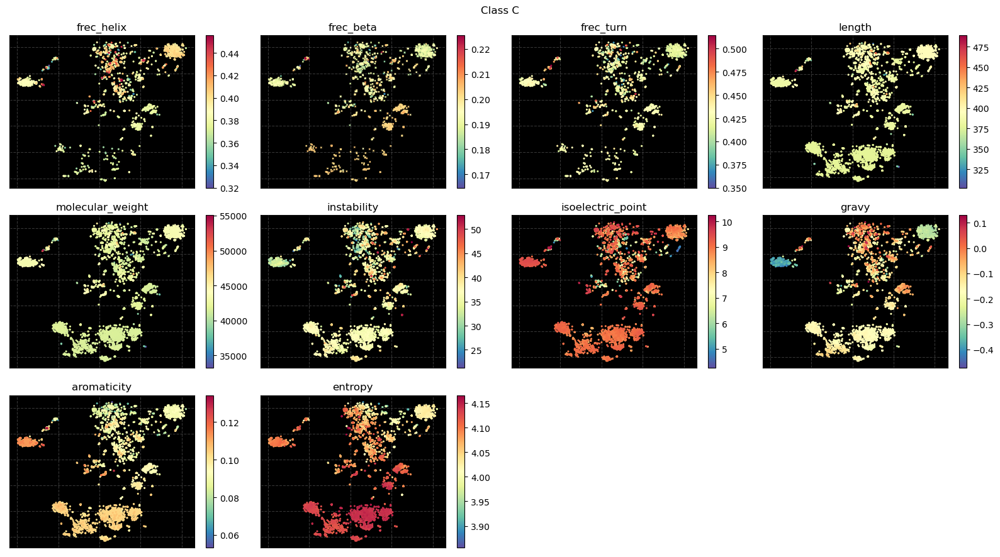

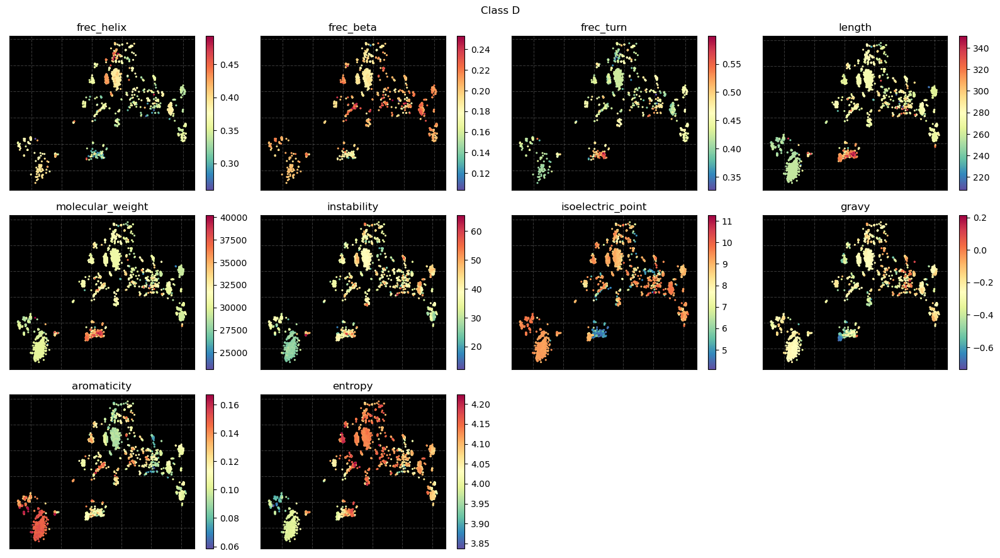

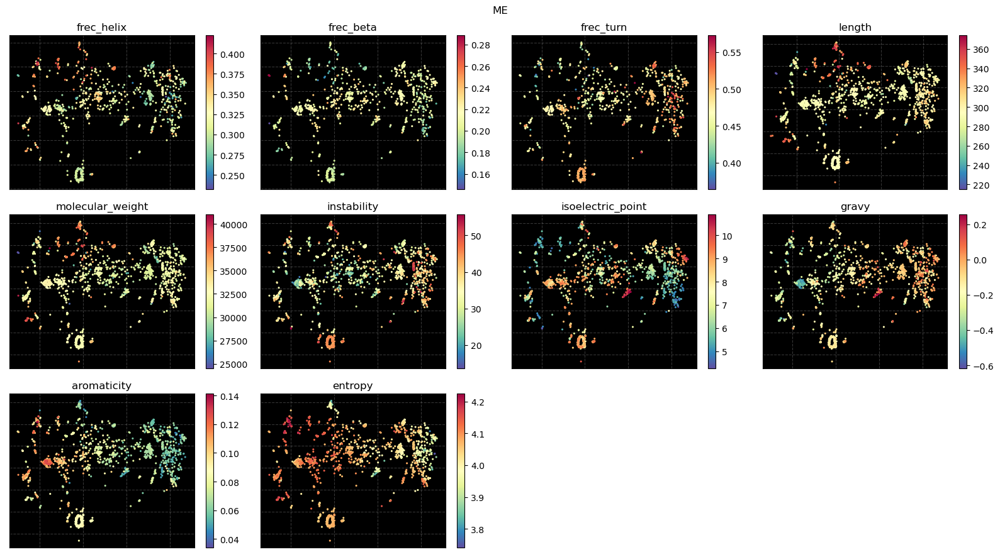

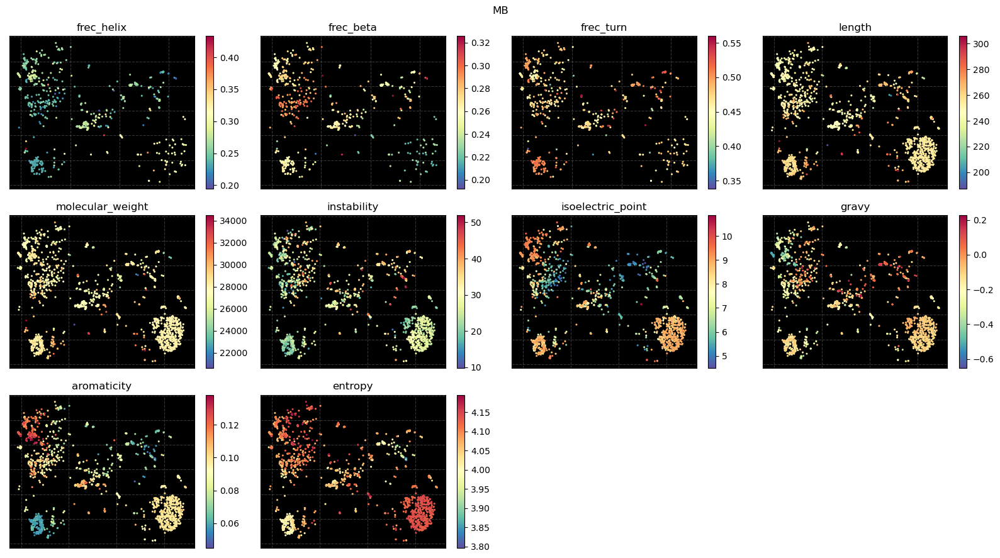

In [136]:
do_scatter_panel(sbl_a2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"Class A")
do_scatter_panel(sbl_c2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"Class C")
do_scatter_panel(sbl_d2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"Class D")
do_scatter_panel(mbl_me2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"ME")
do_scatter_panel(mbl_mb2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"MB")

In [102]:
def do_scatter_panel_corr(df, dim1, dim2, title):

    # set figure composition
    plt.figure(figsize=(16, 9))  

    # iterate over each panel
    for idx, prop in enumerate(properties):
        
        # Filter the DataFrame if prop is in af2_data
        if prop in af2_data:
            filtered_df = df[df['has_af2_model'] == 'yes']
        else:
            filtered_df = df

        # set palette
        palette = "Spectral_r"
        # create continuous colorbar normalized
        norm = plt.Normalize(filtered_df[prop].min(), filtered_df[prop].max())
        sm = plt.cm.ScalarMappable(cmap=palette, norm=norm)
        sm.set_array([])

        # compute corrs
        data = filtered_df[prop].values
        spearman_x, _ = spearmanr(filtered_df[dim1].values, data, nan_policy='omit')
        spearman_y, _ = spearmanr(filtered_df[dim2].values, data, nan_policy='omit')

        # plot
        ax = plt.subplot(3, 4, idx + 1)
        sns.scatterplot(
            data=filtered_df.sort_values(prop, ascending=False), x=dim1, y=dim2, alpha=0.5,
            style="bla_subclass", hue=prop, palette=palette, edgecolor="none", ax=ax)
        ax.set_title(f"{prop}")

        # axes
        ax.grid(alpha=0.3, linestyle="--")
        ax.set_ylabel(f"Spearman = {spearman_y:.2f}")
        ax.set_xlabel(f"Spearman = {spearman_x:.2f}")
        ax.tick_params(axis='both', colors='black')
        ax.set_axisbelow(True)
        ax.set_facecolor('k')
        ax.tick_params(axis='both', colors='w')
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        # remove default legend and add colorbar
        ax.get_legend().remove()
        cbar = ax.figure.colorbar(sm, ax=ax)
        cbar.set_label("")  # set label for colorbar

    plt.suptitle(title)
    plt.tight_layout()

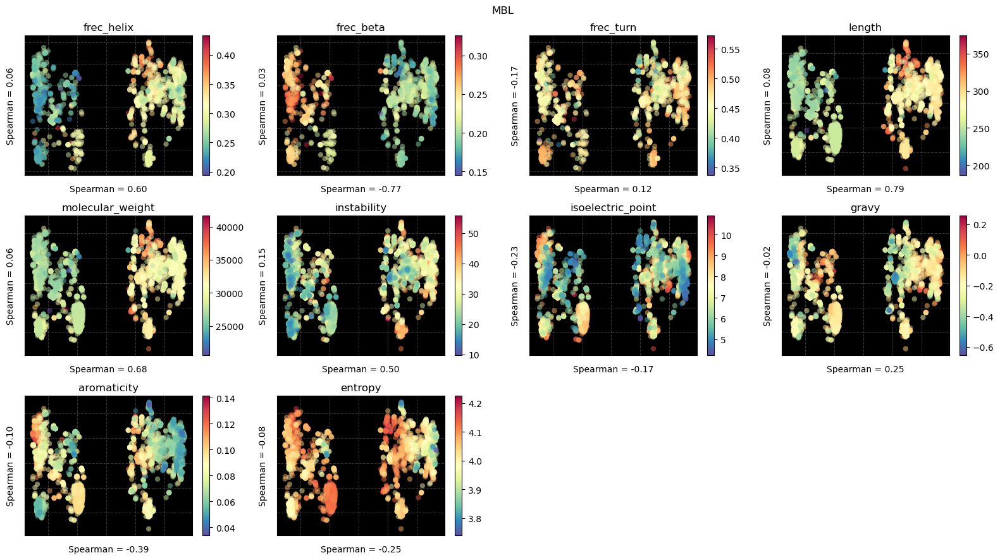

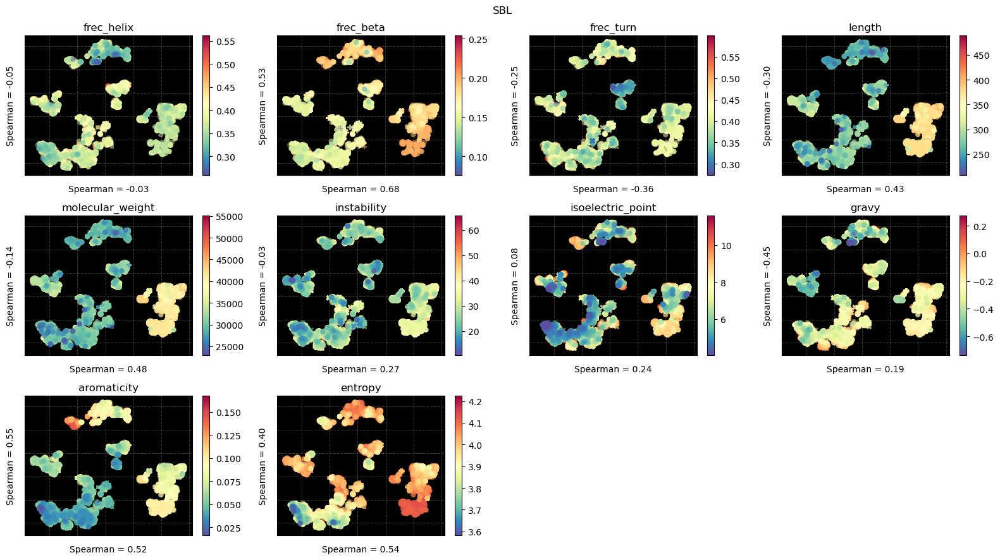

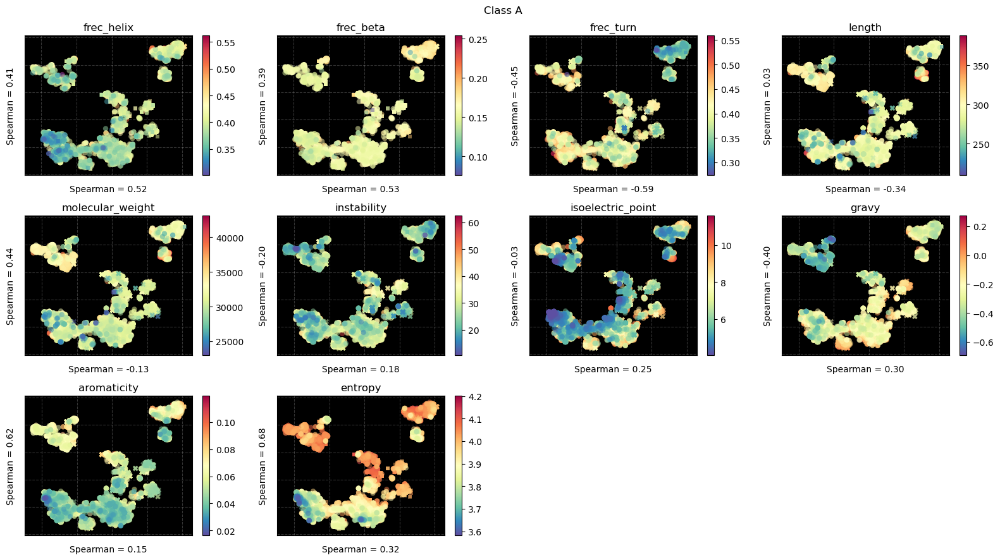

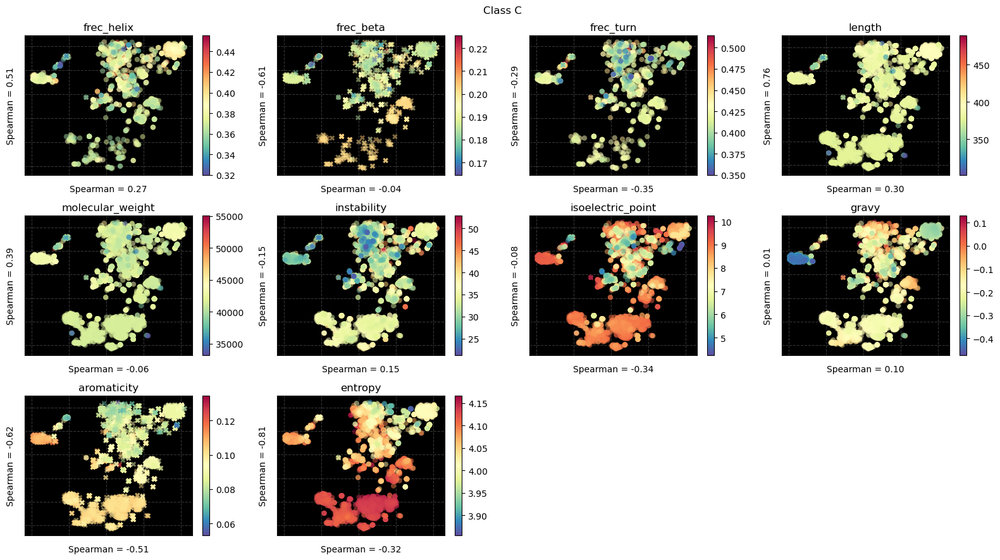

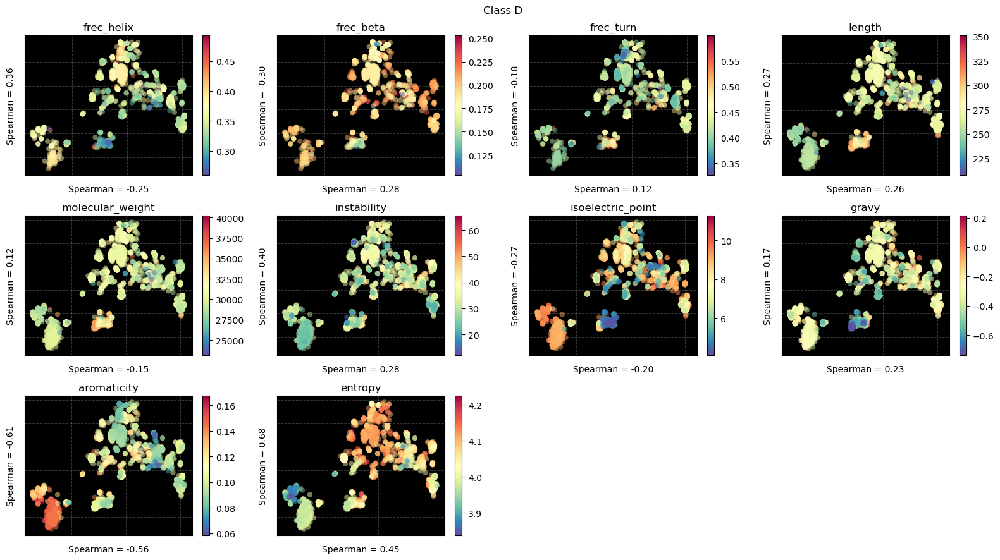

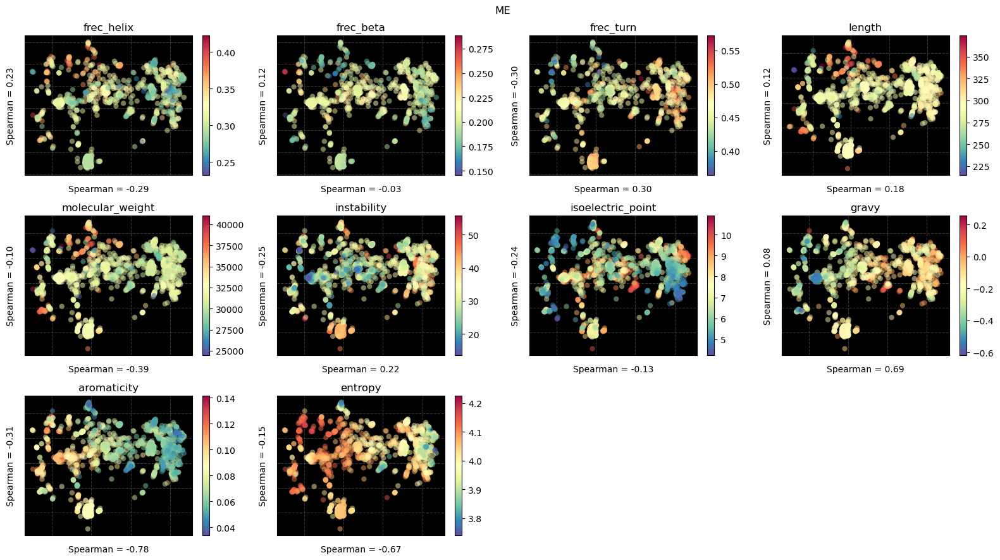

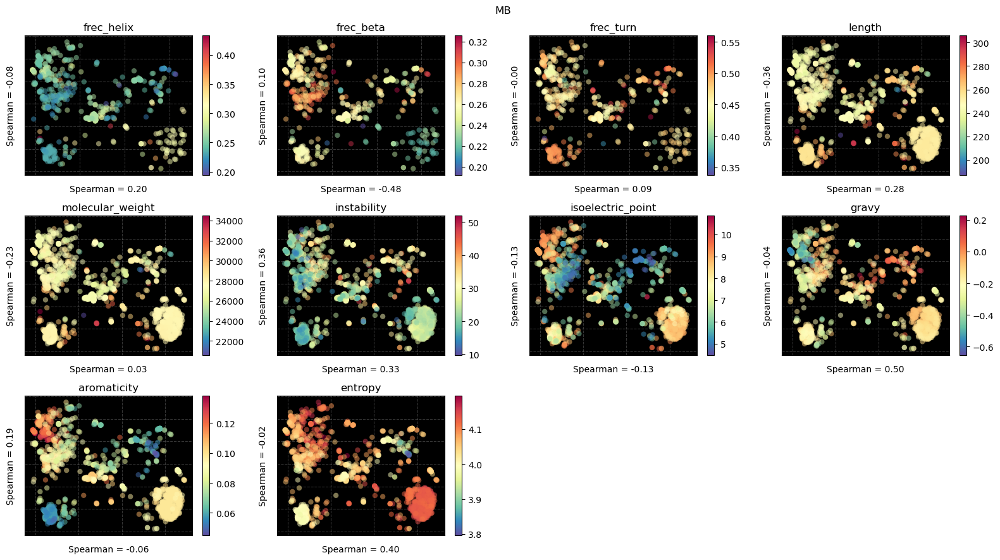

In [103]:
do_scatter_panel_corr(mbl2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"MBL")
do_scatter_panel_corr(sbl2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"SBL")
do_scatter_panel_corr(sbl_a2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"Class A")
do_scatter_panel_corr(sbl_c2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"Class C")
do_scatter_panel_corr(sbl_d2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"Class D")
do_scatter_panel_corr(mbl_me2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"ME")
do_scatter_panel_corr(mbl_mb2,"tsne1_esm1b_400","tsne2_esm1b_400" ,"MB")

# tsne dims

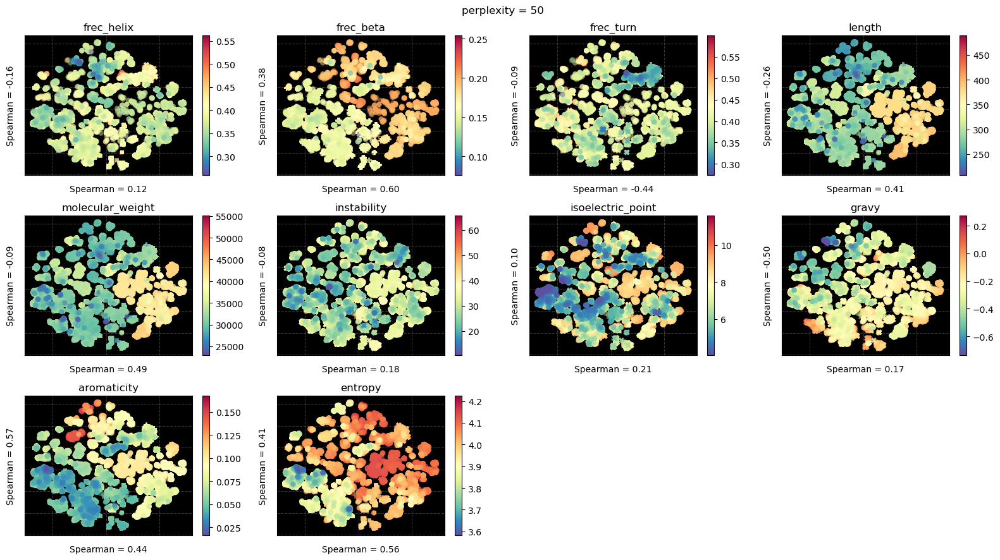

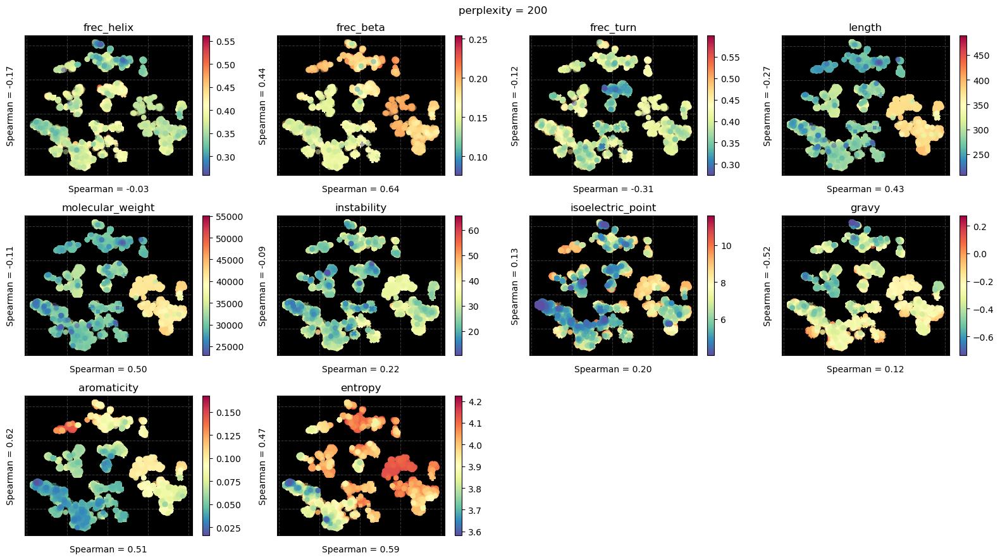

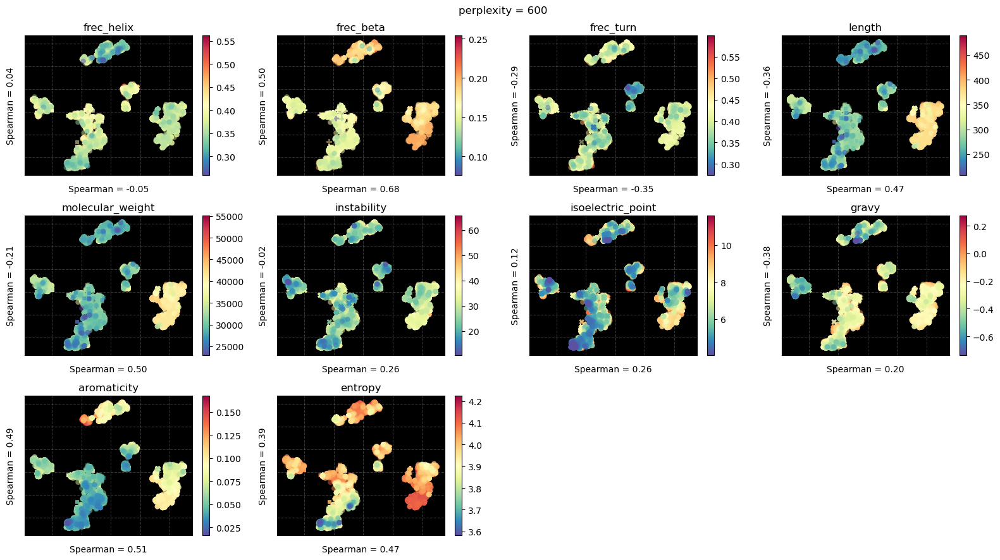

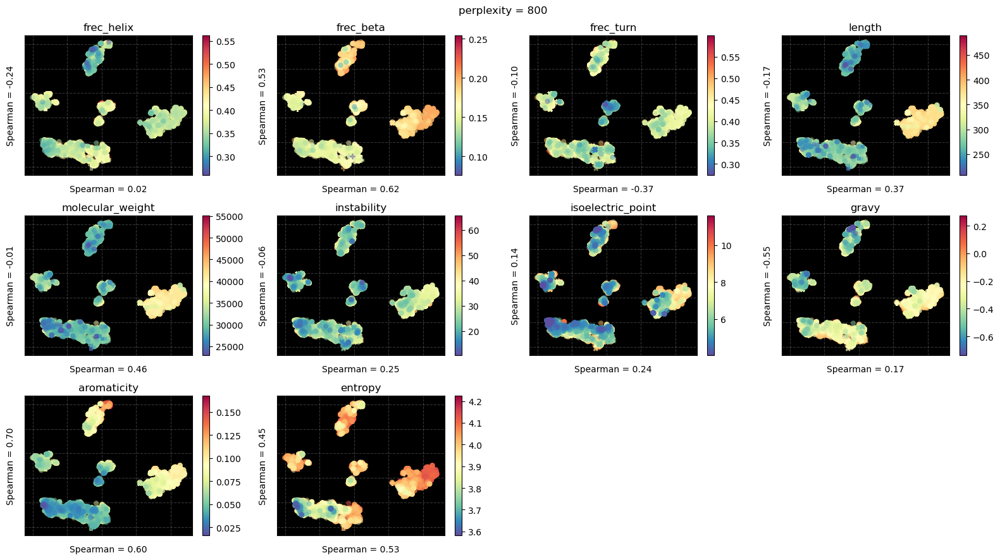

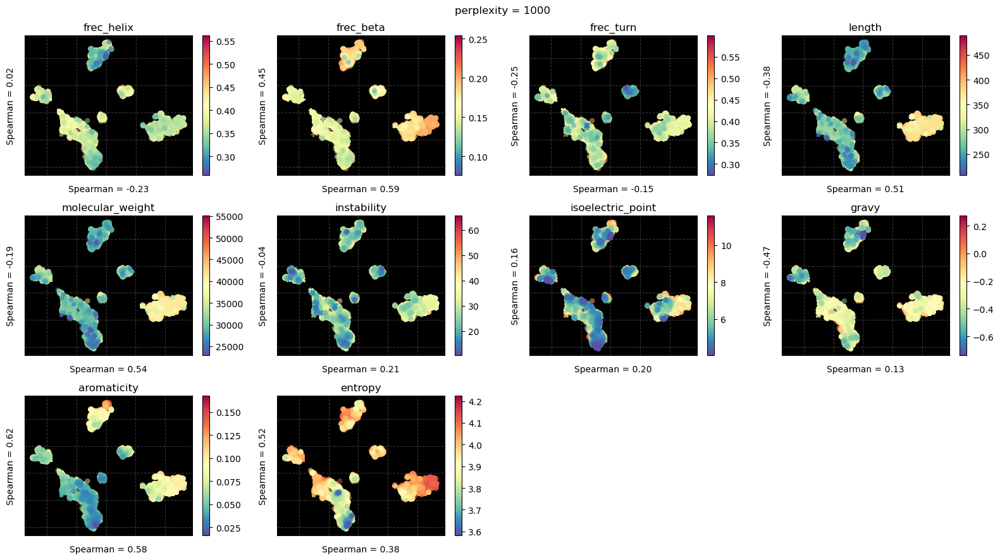

In [106]:
do_scatter_panel_corr(sbl2,"tsne1_esm1b_50","tsne2_esm1b_50" ,"perplexity = 50")
do_scatter_panel_corr(sbl2,"tsne1_esm1b_200","tsne2_esm1b_200" ,"perplexity = 200")
do_scatter_panel_corr(sbl2,"tsne1_esm1b_600","tsne2_esm1b_600" ,"perplexity = 600")
do_scatter_panel_corr(sbl2,"tsne1_esm1b_800","tsne2_esm1b_800" ,"perplexity = 800")
do_scatter_panel_corr(sbl2,"tsne1_esm1b_1000","tsne2_esm1b_1000" ,"perplexity = 1000")

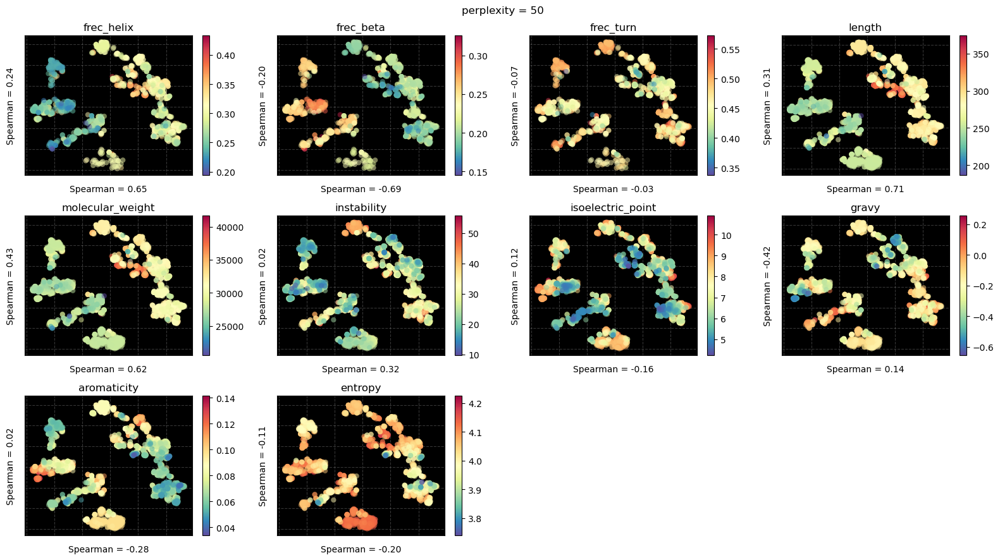

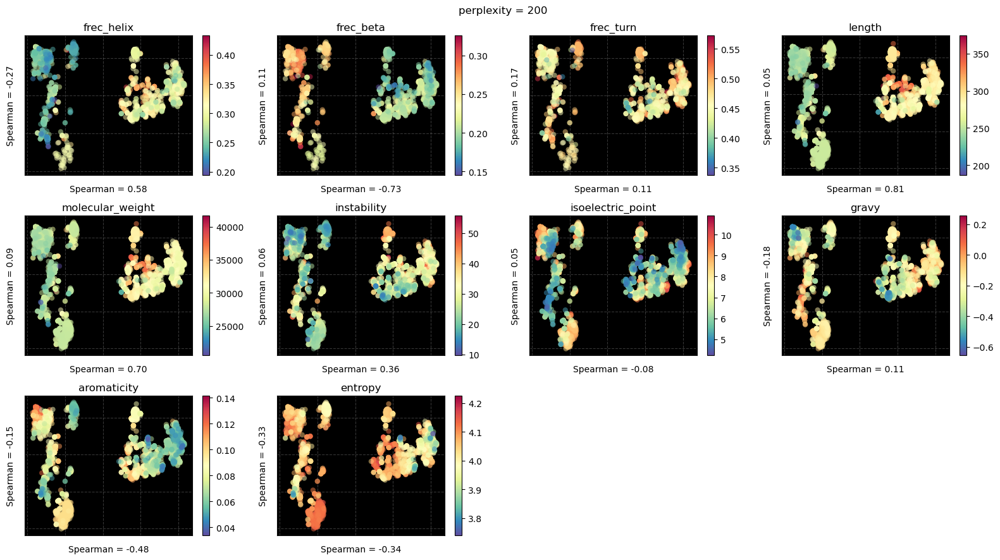

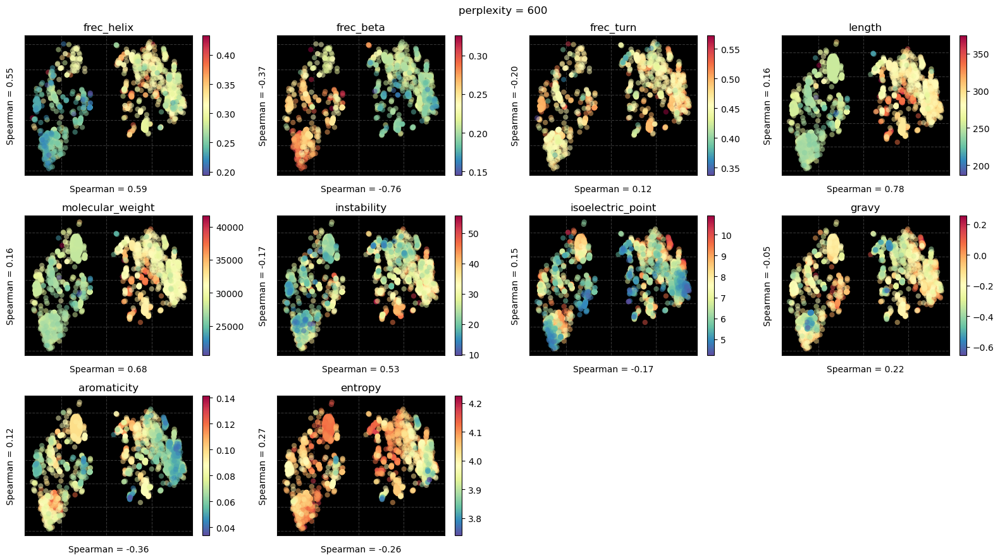

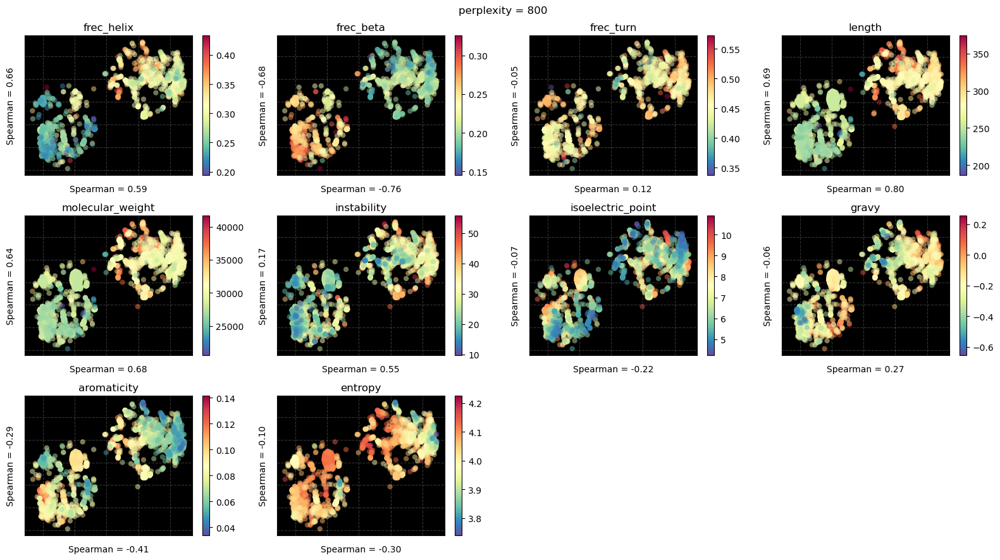

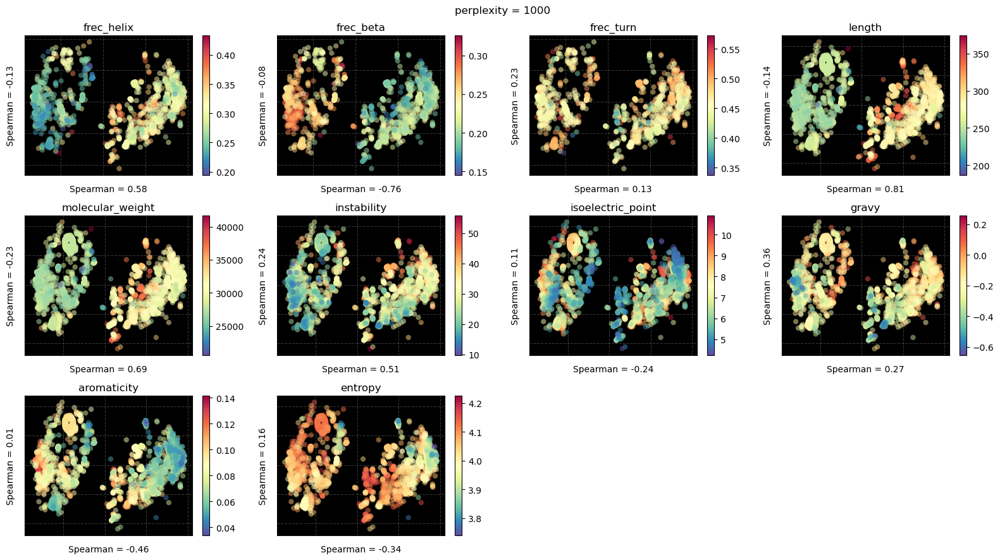

In [105]:
do_scatter_panel_corr(mbl2,"tsne1_esm1b_50","tsne2_esm1b_50" ,"perplexity = 50")
do_scatter_panel_corr(mbl2,"tsne1_esm1b_200","tsne2_esm1b_200" ,"perplexity = 200")
do_scatter_panel_corr(mbl2,"tsne1_esm1b_600","tsne2_esm1b_600" ,"perplexity = 600")
do_scatter_panel_corr(mbl2,"tsne1_esm1b_800","tsne2_esm1b_800" ,"perplexity = 800")
do_scatter_panel_corr(mbl2,"tsne1_esm1b_1000","tsne2_esm1b_1000" ,"perplexity = 1000")

Text(0.5, 1.0, 'n: 12688 | Correlation: -0.15 | p-val: 2.39e-68')

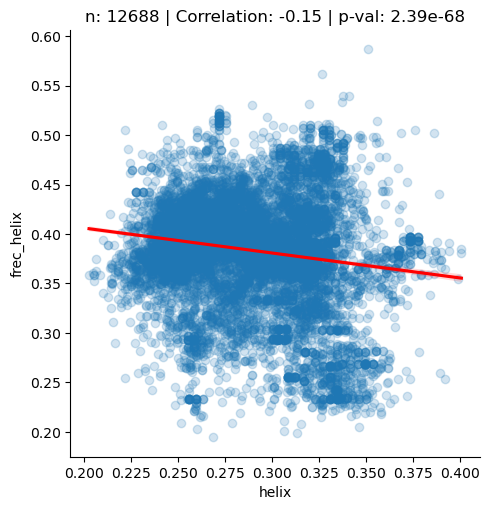

In [54]:
df_ss = df[df.frec_beta.notnull()]

x="helix"
y="frec_helix"
corr, p_val = pearsonr(df_ss[x], df_ss[y])

g=sns.lmplot(df_ss, x=x, y=y, line_kws={'color': 'red'}, scatter_kws={'alpha': 0.2})
plt.title(f'n: {len(df_ss)} | Correlation: {corr:.2f} | p-val: {p_val:.4g}')

/home/gama/anaconda3/envs/bio/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/gama/anaconda3/envs/bio/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


n: 12688 | Correlation: -0.15 | p-val: 2.39e-68


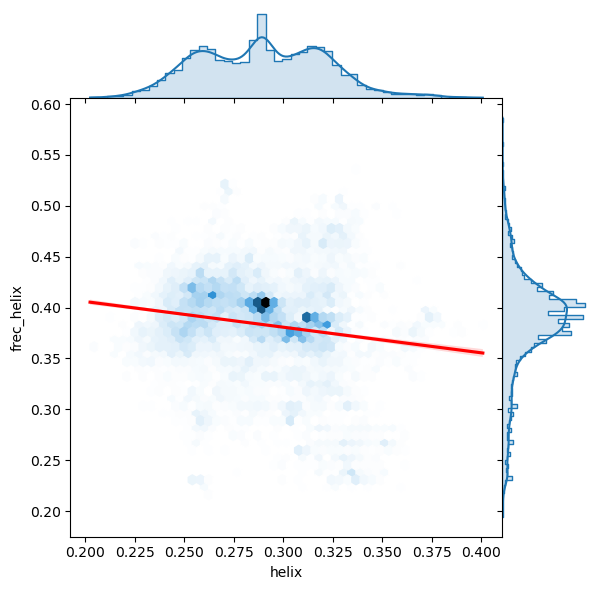

In [70]:
g = sns.jointplot(df_ss, x=x, y=y, kind='hex', height=6, space=0, 
                  marginal_kws=dict(alpha=0.2, fill=True, element="step", kde=True))
sns.regplot(data=df_ss, x=x, y=y, scatter=False, ax=g.ax_joint, line_kws={'color': 'red'})
print(f'n: {len(df_ss)} | Correlation: {corr:.2f} | p-val: {p_val:.4g}')
plt.show()

/home/gama/anaconda3/envs/bio/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/gama/anaconda3/envs/bio/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


n: 12688 | Correlation: 0.12 | p-val: 1.73e-40


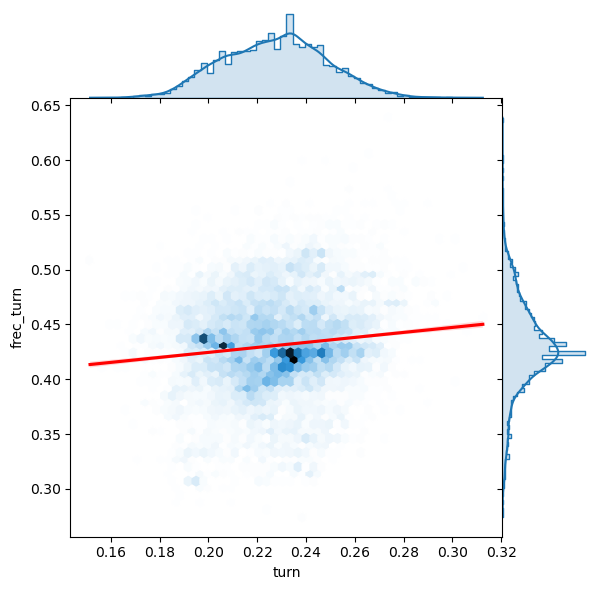

In [71]:
x="turn"
y="frec_turn"
corr, p_val = pearsonr(df_ss[x], df_ss[y])

g = sns.jointplot(df_ss, x=x, y=y, kind='hex', height=6, space=0, 
                  marginal_kws=dict(alpha=0.2, fill=True, element="step", kde=True))
sns.regplot(data=df_ss, x=x, y=y, scatter=False, ax=g.ax_joint, line_kws={'color': 'red'})
print(f'n: {len(df_ss)} | Correlation: {corr:.2f} | p-val: {p_val:.4g}')
plt.show()

/home/gama/anaconda3/envs/bio/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/gama/anaconda3/envs/bio/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


n: 12688 | Correlation: -0.49 | p-val: 0


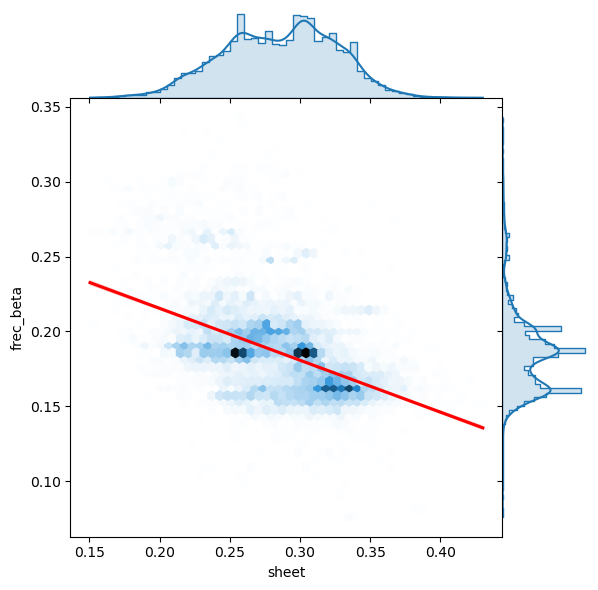

In [72]:
x="sheet"
y="frec_beta"
corr, p_val = pearsonr(df_ss[x], df_ss[y])

g = sns.jointplot(df_ss, x=x, y=y, kind='hex', height=6, space=0, 
                  marginal_kws=dict(alpha=0.2, fill=True, element="step", kde=True))
sns.regplot(data=df_ss, x=x, y=y, scatter=False, ax=g.ax_joint, line_kws={'color': 'red'})
print(f'n: {len(df_ss)} | Correlation: {corr:.2f} | p-val: {p_val:.4g}')
plt.show()